In [87]:
import requests
from PIL import Image
import json

In [88]:
SUBSCRIPTION_KEY = 'a78dd3dac287419b9da9926c974909e3'

In [89]:
assert SUBSCRIPTION_KEY

In [90]:
face_api_url = 'https://20210808-youtube.cognitiveservices.azure.com/face/v1.0/detect'

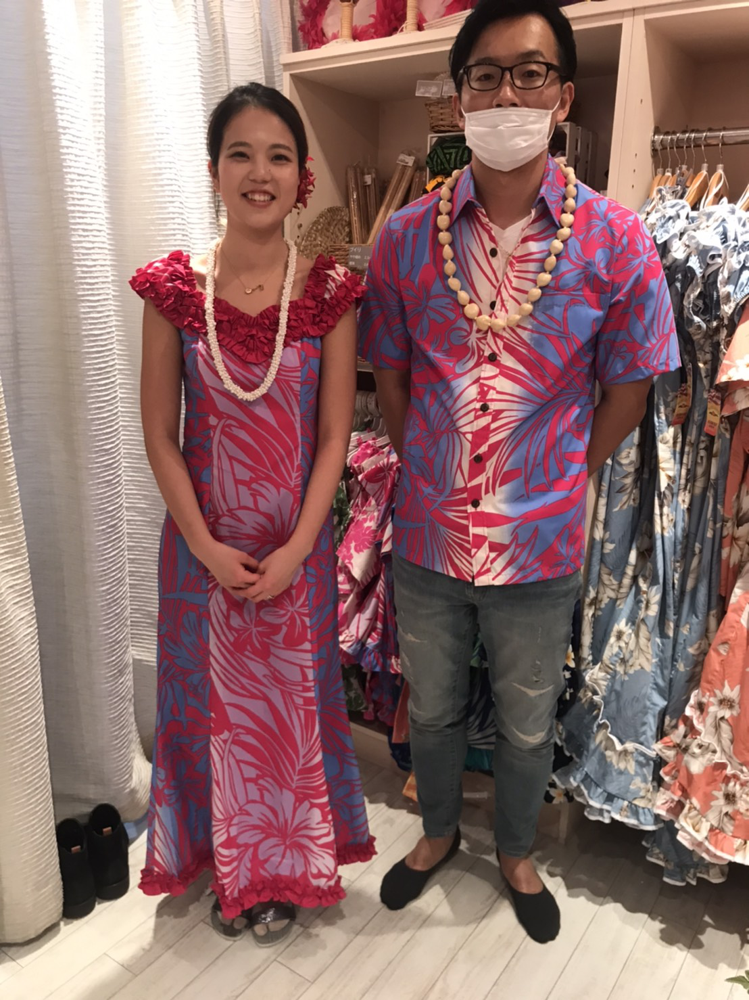

In [91]:
img = Image.open('sample_04.jpg')
img

In [104]:
with open('sample_04.jpg', 'rb') as f:
  binary_img = f.read()

In [105]:
# binary_img

In [106]:
headers = {
  'Content-Type': 'application/octet-stream',
  'Ocp-Apim-Subscription-Key': SUBSCRIPTION_KEY}

params = {
  'returnFaceId': 'true',
  'returnFaceAttributes':'age,gender,blur,exposure,noise,facialhair,glasses,hair,makeup,accessories,occlusion,headpose,emotion,smile',
}

res = requests.post(face_api_url, params=params, headers=headers, data=binary_img)

In [107]:
res

<Response [200]>

In [108]:
result = res.json()
result

[{'faceId': '3a18908d-1de4-41d4-aa87-63d366bd7fa6',
  'faceRectangle': {'top': 196, 'left': 321, 'width': 126, 'height': 126},
  'faceAttributes': {'smile': 1.0,
   'headPose': {'pitch': 3.6, 'roll': 3.6, 'yaw': -2.0},
   'gender': 'female',
   'age': 23.0,
   'facialHair': {'moustache': 0.0, 'beard': 0.0, 'sideburns': 0.0},
   'glasses': 'NoGlasses',
   'emotion': {'anger': 0.0,
    'contempt': 0.0,
    'disgust': 0.0,
    'fear': 0.0,
    'happiness': 1.0,
    'neutral': 0.0,
    'sadness': 0.0,
    'surprise': 0.0},
   'blur': {'blurLevel': 'low', 'value': 0.12},
   'exposure': {'exposureLevel': 'goodExposure', 'value': 0.66},
   'noise': {'noiseLevel': 'low', 'value': 0.0},
   'makeup': {'eyeMakeup': True, 'lipMakeup': True},
   'accessories': [],
   'occlusion': {'foreheadOccluded': False,
    'eyeOccluded': False,
    'mouthOccluded': False},
   'hair': {'bald': 0.16,
    'invisible': False,
    'hairColor': [{'color': 'black', 'confidence': 1.0},
     {'color': 'brown', 'confide

In [109]:
rect = result[0]['faceRectangle']
rect

{'top': 196, 'left': 321, 'width': 126, 'height': 126}

In [110]:
from PIL import ImageDraw
draw = ImageDraw.Draw(img)

In [111]:
# draw.line([(0, 50), (200, 50), (0, 150),(200, 150)], fill='red', width=5)
# img

In [112]:
rect

{'top': 196, 'left': 321, 'width': 126, 'height': 126}

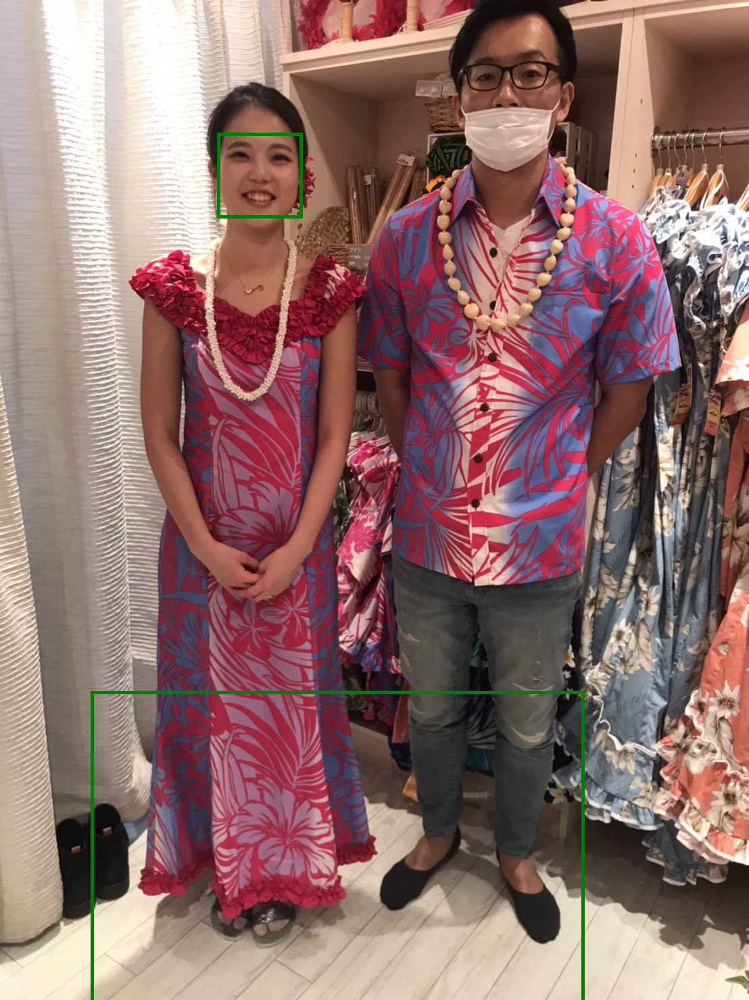

In [113]:
draw.rectangle([(rect['left'], rect['top']),(rect['left']+rect['width'],rect['top']+rect['height'])], fill=None, outline='green', width=5)
img

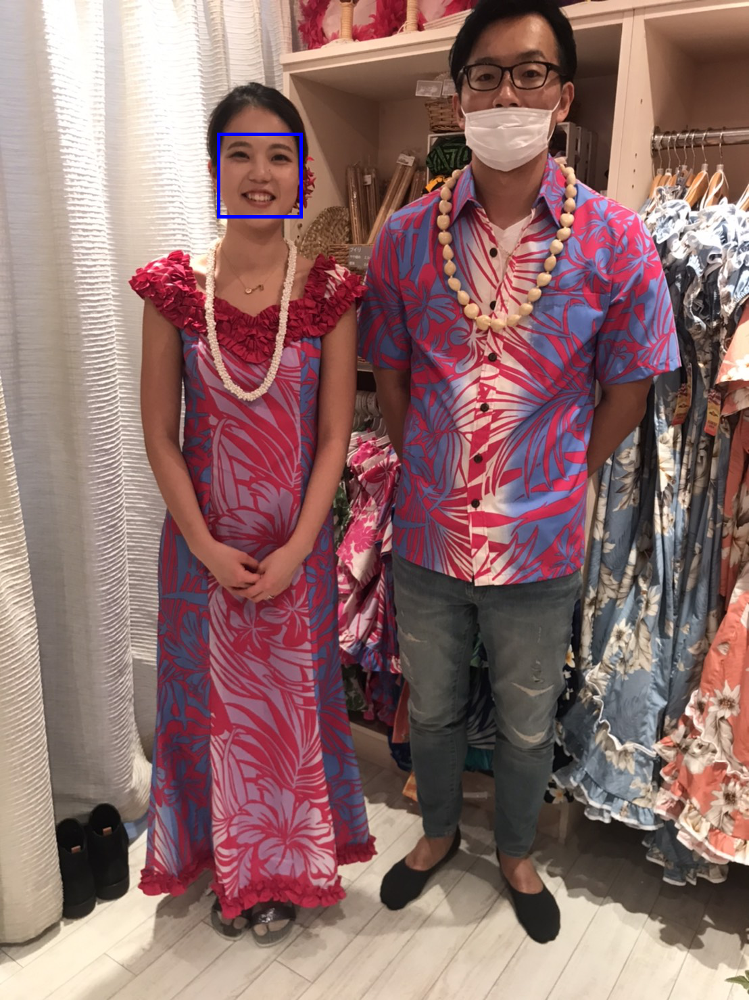

In [119]:





import requests
from PIL import Image
import json
from PIL import ImageDraw

SUBSCRIPTION_KEY = 'a78dd3dac287419b9da9926c974909e3'
assert SUBSCRIPTION_KEY

face_api_url = 'https://20210808-youtube.cognitiveservices.azure.com/face/v1.0/detect'
img = Image.open('sample_04.jpg')

with open('sample_04.jpg', 'rb') as f:
  binary_img = f.read()

headers = {
  'Content-Type': 'application/octet-stream',
  'Ocp-Apim-Subscription-Key': SUBSCRIPTION_KEY}

params = {
  'returnFaceId': 'true',
  'returnFaceAttributes':'age,gender,blur,exposure,noise,facialhair,glasses,hair,makeup,accessories,occlusion,headpose,emotion,smile',
}

res = requests.post(face_api_url, params=params, headers=headers, data=binary_img)

results = res.json()

for result in results:
  rect = result['faceRectangle']

  draw = ImageDraw.Draw(img)
  draw.rectangle([(rect['left'], rect['top']),(rect['left']+rect['width'],rect['top']+rect['height'])], fill=None, outline='blue', width=5)
img



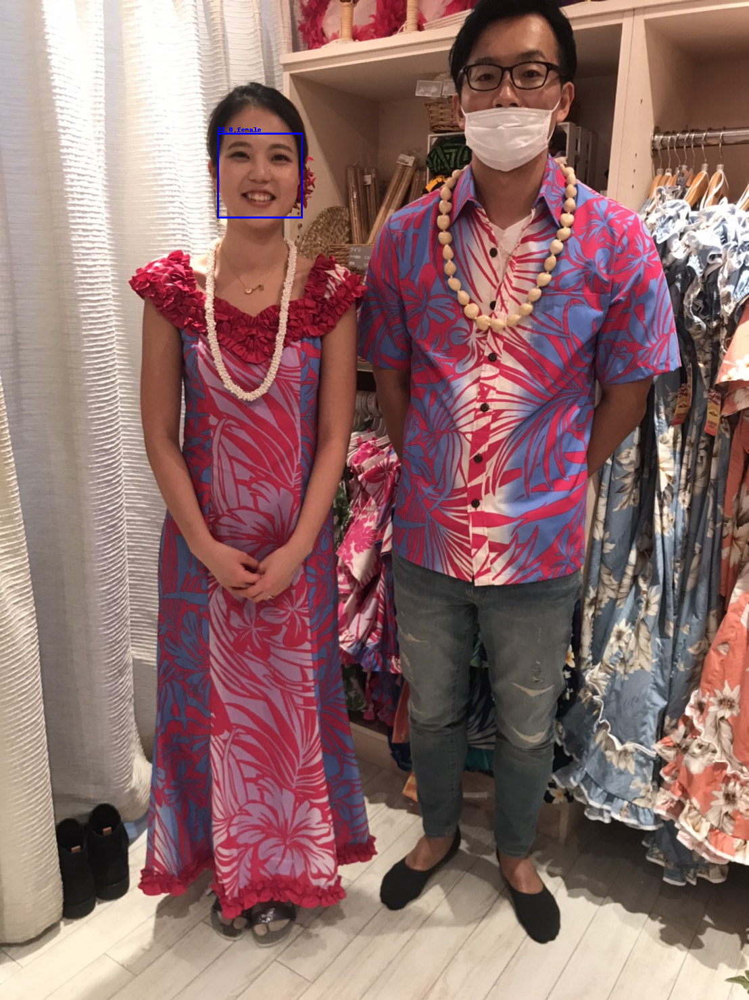

In [157]:






import requests
from PIL import Image
import json
from PIL import ImageDraw, ImageFont

SUBSCRIPTION_KEY = 'a78dd3dac287419b9da9926c974909e3'
assert SUBSCRIPTION_KEY

face_api_url = 'https://20210808-youtube.cognitiveservices.azure.com/face/v1.0/detect'
img = Image.open('sample_04.jpg')

with open('sample_04.jpg', 'rb') as f:
  binary_img = f.read()

headers = {
  'Content-Type': 'application/octet-stream',
  'Ocp-Apim-Subscription-Key': SUBSCRIPTION_KEY}

params = {
  'returnFaceId': 'true',
  'returnFaceAttributes':'age,gender,blur,exposure,noise,facialhair,glasses,hair,makeup,accessories,occlusion,headpose,emotion,smile',
}

res = requests.post(face_api_url, params=params, headers=headers, data=binary_img)

results = res.json()

for result in results:
  rect = result['faceRectangle']
  age = result['faceAttributes']['age']
  gender = result['faceAttributes']['gender']

# # よくわからない。。。
  # textsize = 20
  # font = ImageFont.truetype("arial.ttf", size=textsize)

  draw = ImageDraw.Draw(img)
  draw.rectangle([(rect['left'], rect['top']),(rect['left']+rect['width'],rect['top']+rect['height'])], fill=None, outline='blue', width=3)

  draw.text((rect['left'], rect['top']-10), f'{age},{gender}', fill='blue')
img




In [134]:
results[0]['faceAttributes']['gender']

'male'

In [135]:
results[0]['faceAttributes']['age']

24.0